<a href="https://colab.research.google.com/github/NJain121442/course2020/blob/master/17August_SEM_Conv2d_V2_w/o_FC_M0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kornia
from kornia import filters
import torch.nn as nn
import glob
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
from torchsummary import summary 
import torchvision
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from PIL import Image

     |████████████████████████████████| 204kB 7.3MB/s 


In [2]:
#from google.colab import drive 
#drive.mount("/content/drive")

In [3]:
!unzip /content/M0_120_class_images.zip -d /content/

Archive:  /content/M0_120_class_images.zip
   creating: /content/M0_Selected_class_images/
  inflating: /content/M0_Selected_class_images/Defect_103973_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_105326_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_105665_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_107357_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_107695_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_109387_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111079_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111418_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111756_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_113786_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_11421

In [23]:
#Data_path = "/content/Fruits/"
#Data_path = "/content/drive/My Drive/AutoEncoder_training/AutoEncoder_training/"
#Data_path = "/content/drive/My Drive/All_class_images"
Data_path = "/content/M0_Selected_class_images"
File_list = glob.glob(Data_path+'/*.tiff')

In [24]:
len(File_list)

120

Lets Resize all images to same size

In [25]:
class CustomDataset(Dataset):
  def __init__(self,path,new_size = 226):
    #self.filelist = glob.glob(path+'/*.jfif')
    self.filelist = glob.glob(path+'/*.tiff')
    self.new_size = new_size

  def __len__(self):
    return len(self.filelist)

  def __getitem__(self, idx):
    temp_filepath = self.filelist[idx]
    temp_image = cv2.imread(temp_filepath)
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2GRAY)
    temp_image = temp_image/255
    temp_image = torch.Tensor(temp_image)
    temp_image = temp_image.unsqueeze(0)
    return temp_image

In [26]:
Data = CustomDataset(Data_path)
Data[1].shape

torch.Size([1, 504, 504])

In [27]:
class COV2D_AutoEncoder(nn.Module):
    def __init__(self,filters = [32,64,128,64]):
        super(COV2D_AutoEncoder,self).__init__()
        self.enc1 = nn.Conv2d(1,filters[0],kernel_size=3,stride=3)
        self.enc2 = nn.Conv2d(filters[0],filters[1],kernel_size=3,stride=3)
        self.enc3 = nn.Conv2d(filters[1],filters[2],kernel_size=2,stride=3)
        self.enc4 = nn.Conv2d(filters[2],filters[3],kernel_size=3,stride=2)
        self.pool = nn.MaxPool2d(2,2,return_indices=True)
        self.dec1 = nn.ConvTranspose2d(filters[3],filters[2],kernel_size=3,stride=2)
        self.dec2 = nn.ConvTranspose2d(filters[2],filters[1], kernel_size=2, stride=3)  
        self.dec3 = nn.ConvTranspose2d(filters[1],filters[0], kernel_size=3, stride=3)
        self.dec4 = nn.ConvTranspose2d(filters[0] ,1, kernel_size=3, stride=3)
        self.unpool = nn.MaxUnpool2d(2,2,padding=0)

    def forward(self,x):
        x = F.relu(self.enc1(x)) # output will be 168x168x64
        x,indices1 = self.pool(x) #output will be 84x84x64
        x= F.relu(self.enc2(x)) #output will be 28x28x128
        x,indices2 = self.pool(x)   # output will be 14x14x128
        x= F.relu(self.enc3(x)) #output will be 5x5x256
        x= F.relu(self.enc4(x)) #output will be 2x2x512
        Encoded_rep,indices3 = self.pool(x)   # output will be 1x1x512
        x = self.unpool(Encoded_rep,indices3)   # output will be 2x2x512
        x = F.relu(self.dec1(x)) # ouput will be 5x5x256
        x = F.relu(self.dec2(x)) # output will be 14x14x128
        x = self.unpool(x,indices2) #output will be 28x28x128
        x = F.relu(self.dec3(x)) # output will be 84x84x64
        x = self.unpool(x,indices1) #output will be 28x28x128
        x = torch.sigmoid(self.dec4(x)) # output will be 504x504x1
        return x,Encoded_rep.view(-1,64)

**Lets write the first Auto encoder **

In [28]:
net = COV2D_AutoEncoder()
print(net)
if torch.cuda.is_available():
    net.cuda()
summary(net,input_size=(1,504,504),batch_size=2)

COV2D_AutoEncoder(
  (enc1): Conv2d(1, 32, kernel_size=(3, 3), stride=(3, 3))
  (enc2): Conv2d(32, 64, kernel_size=(3, 3), stride=(3, 3))
  (enc3): Conv2d(64, 128, kernel_size=(2, 2), stride=(3, 3))
  (enc4): Conv2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dec1): ConvTranspose2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
  (dec2): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(3, 3))
  (dec3): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(3, 3))
  (dec4): ConvTranspose2d(32, 1, kernel_size=(3, 3), stride=(3, 3))
  (unpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [2, 32, 168, 168]             320
         MaxPool2d-2  [[-1, 32, 84, 84], [-1, 32, 84, 84]]               0
            Conv2d-3            [

In [29]:
train_loader = DataLoader(Data,batch_size=2)

In [30]:
#from torch.optim.lr_scheduler import ReduceLROnPlateau
loss_func = nn.MSELoss()
#loss_func = nn.L1Loss()
optimizer = optim.Adam(net.parameters(), lr=0.0001) 
#optimizer = optim.SGD(net.parameters(), lr=0.01) 
#scheduler = ReduceLROnPlateau(optimizer, 'min')


Training the Auto encoder

In [34]:
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

n_epochs = 100

if torch.cuda.is_available():
    net.cuda()
total_loss = []

epoch_loss = 0
net.train()
for epoch in tqdm(range(n_epochs)):
    print("current epoch is:",epoch)
    epoch_loss = 0
    for x in train_loader:
        mse_loss = 0
        if torch.cuda.is_available():
          x = x.cuda()
        optimizer.zero_grad()
        prediction = net(x)
        SpatialGradient = filters.SpatialGradient()
        loss_der = loss_func(SpatialGradient(prediction[0]), SpatialGradient(x))
        mse_loss = loss_func(prediction[0], x) # <-- note that i'm using the input as the target
        (mse_loss+loss_der).backward()
        optimizer.step()
        epoch_loss = epoch_loss + mse_loss.item() + loss_der.item()
        #scheduler.step(epoch_loss)
        
    #clear_output(wait=True)
    total_loss.append(epoch_loss)
    print('Loss Per epoch: ',epoch_loss)

current epoch is: 0
Loss Per epoch:  3.084485591738485
current epoch is: 1
Loss Per epoch:  3.0786283082561567
current epoch is: 2
Loss Per epoch:  3.072523096227087
current epoch is: 3
Loss Per epoch:  3.066591054201126
current epoch is: 4
Loss Per epoch:  3.061313104000874
current epoch is: 5
Loss Per epoch:  3.0553114246577024
current epoch is: 6
Loss Per epoch:  3.0503716313978657
current epoch is: 7
Loss Per epoch:  3.045281572500244
current epoch is: 8
Loss Per epoch:  3.04039381199982
current epoch is: 9
Loss Per epoch:  3.0358782195253298
current epoch is: 10
Loss Per epoch:  3.0307849147357047
current epoch is: 11
Loss Per epoch:  3.026970778708346
current epoch is: 12
Loss Per epoch:  3.0229009886970744
current epoch is: 13
Loss Per epoch:  3.019257346750237
current epoch is: 14
Loss Per epoch:  3.0152046815492213
current epoch is: 15
Loss Per epoch:  3.0101873143576086
current epoch is: 16
Loss Per epoch:  3.006743398727849
current epoch is: 17
Loss Per epoch:  3.00278735673

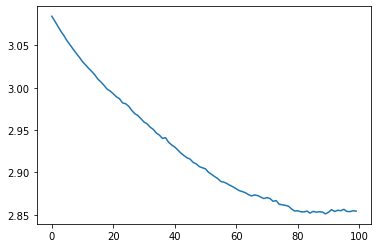

In [35]:
import matplotlib.pyplot as plt
plt.plot(total_loss)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


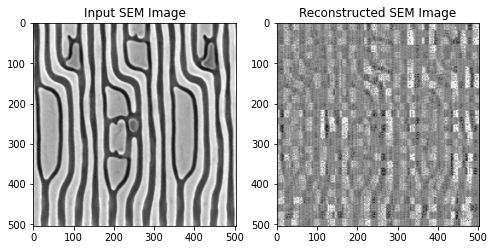

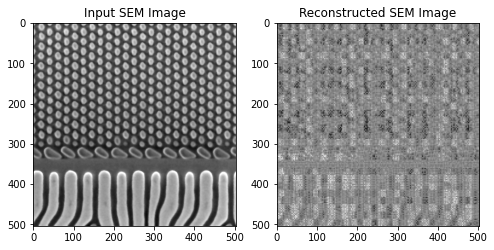

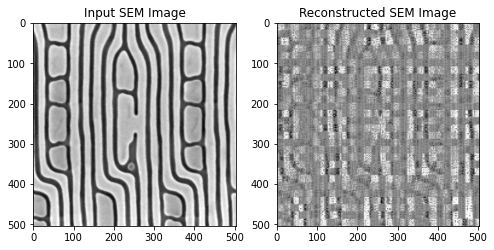

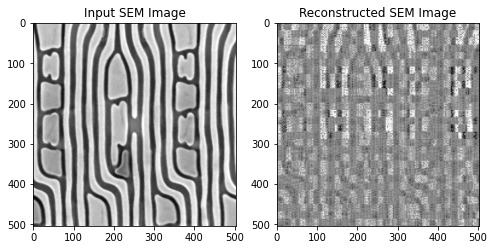

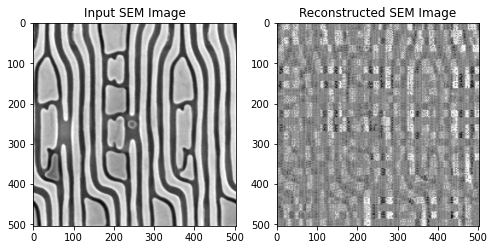

...

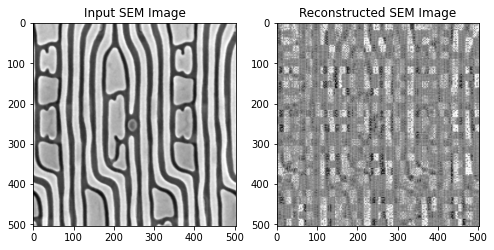

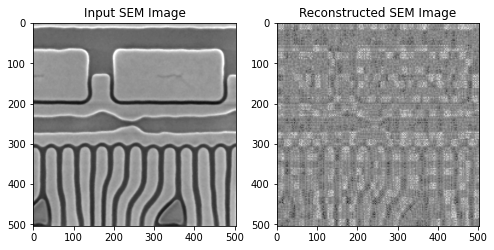

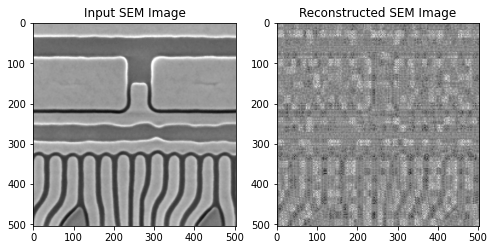

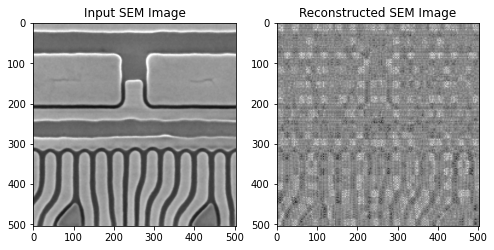

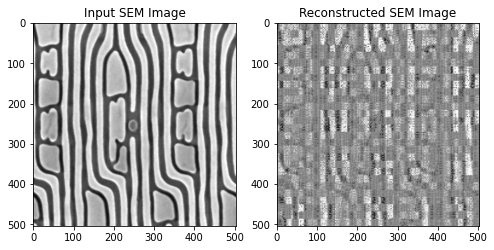

In [36]:
net.cpu()
net.eval()
counter = 0
for i in range(30):
    counter = counter + 1
    fig,ax = plt.subplots(1,2,figsize=(8,4))
    x = Data[i]
    input_img = x[0]
    #print(input_img)
    model_pred = net(x.unsqueeze(0))[0].cpu().data.numpy()[0][0]
    #print(model_pred.shape)
    ax[0].set_title('Input SEM Image',fontsize=12)
    ax[1].set_title('Reconstructed SEM Image',fontsize=12)
    ax[0].imshow(input_img,cmap='gray',vmin=0,vmax=1)
    ax[1].imshow(model_pred,cmap='gray',vmin=0,vmax=1)


Extract Latent representation from Encoder 

Do Clustering and calculate Silhouette Score

In [37]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import preprocessing
Attributes = np.empty([len(Data),64])
#print(Attributes.shape)
for i,x in enumerate(Data):
  Temp_results = net(x.unsqueeze(0))
  #print(Temp_results[0])
  Temp_Attributes = (Temp_results[1]).cpu().data.numpy()
  #print("Temp_Attributes:",Temp_Attributes)
  Attributes[i] = Temp_Attributes
  #print(Attributes[i].shape)
#print(Attributes.shape)

In [45]:
k=7
Attributes_scaled = preprocessing.scale(Attributes)
print(Attributes_scaled.shape)
print(Attributes_scaled.mean(axis=0))
print(Attributes_scaled.std(axis=0))
kmeans = KMeans(n_clusters=k,random_state=0).fit(Attributes_scaled)
Clustering_labels = kmeans.labels_
print(Clustering_labels)
Score = silhouette_score(Attributes_scaled,Clustering_labels,metric='euclidean')
print(Score)
sample_score = silhouette_samples(Attributes_scaled,Clustering_labels,metric='euclidean')
#print(sample_score)

(120, 64)
[ 2.82181685e-17  4.99600361e-17 -2.53500924e-16  0.00000000e+00
 -2.03540888e-17  4.97287396e-16  0.00000000e+00 -4.30211422e-17
 -2.86807615e-17  1.20274161e-17 -2.31296463e-17  0.00000000e+00
  1.31376391e-16  0.00000000e+00  5.55111512e-18 -1.63757896e-16
  0.00000000e+00  1.85037171e-16  5.00973684e-17  7.81782047e-17
  6.05996734e-17  5.45859654e-17  5.27355937e-17 -1.69771604e-16
 -1.08246745e-16 -1.11022302e-17 -1.70234197e-16  0.00000000e+00
  1.94289029e-17  1.45254179e-16  0.00000000e+00 -6.52256027e-17
  0.00000000e+00 -4.25585493e-17  9.25185854e-18  1.16573418e-16
 -1.71159383e-16 -1.42478621e-16  7.40148683e-17  0.00000000e+00
 -1.20274161e-16 -9.06682137e-17  0.00000000e+00  6.01370805e-17
 -4.53341068e-17  0.00000000e+00  0.00000000e+00  1.01770444e-17
  0.00000000e+00  1.85037171e-17  0.00000000e+00 -1.66533454e-17
 -1.85037171e-18 -1.98914959e-17 -6.75385673e-17  0.00000000e+00
 -2.09092003e-16  7.21644966e-17 -5.82867088e-17  0.00000000e+00
  0.00000000e+0

In [46]:
max(sample_score)

0.643501873146743

Find Optimal K using Silhouette score

In [47]:
import pandas as pd 
column_names = ["Image","Label","Score"]
df = pd.DataFrame(columns = column_names,index=np.arange(len(Data)))
df['Image'][88]

for i,x in enumerate(Data):
  df['Image'][i] = (x[0]).data.numpy()
  df['Label'][i] = Clustering_labels[i]
  df['Score'][i] = sample_score[i]
  #print(input_img)
  df

In [48]:
df= df.sort_values('Label',ignore_index=True)
print(df)
df['Image'][110]

                                                 Image Label      Score
0    [[0.65882355, 0.654902, 0.6509804, 0.6509804, ...     0   0.176782
1    [[0.65882355, 0.6509804, 0.64705884, 0.6431373...     0   0.257993
2    [[0.69411767, 0.68235296, 0.6745098, 0.6666667...     0   0.176218
3    [[0.6627451, 0.6627451, 0.65882355, 0.654902, ...     0   0.122395
4    [[0.4, 0.4, 0.4, 0.39607844, 0.39215687, 0.4, ...     0   0.367801
..                                                 ...   ...        ...
115  [[0.69803923, 0.67058825, 0.60784316, 0.458823...     6  0.0597924
116  [[0.72156864, 0.7372549, 0.7529412, 0.7529412,...     6   0.476571
117  [[0.8666667, 0.8745098, 0.88235295, 0.8627451,...     6   0.345183
118  [[0.5568628, 0.5372549, 0.49411765, 0.42745098...     6    0.20576
119  [[0.7372549, 0.6156863, 0.44313726, 0.38431373...     6   0.219449

[120 rows x 3 columns]


array([[0.72156864, 0.7176471 , 0.7176471 , ..., 0.7176471 , 0.70980394,
        0.69803923],
       [0.7137255 , 0.70980394, 0.70980394, ..., 0.7176471 , 0.69803923,
        0.6784314 ],
       [0.69803923, 0.69411767, 0.69411767, ..., 0.7176471 , 0.68235296,
        0.6627451 ],
       ...,
       [0.6431373 , 0.63529414, 0.63529414, ..., 0.78039217, 0.7921569 ,
        0.8039216 ],
       [0.63529414, 0.627451  , 0.627451  , ..., 0.7764706 , 0.7882353 ,
        0.8       ],
       [0.627451  , 0.62352943, 0.61960787, ..., 0.77254903, 0.7882353 ,
        0.79607844]], dtype=float32)

120


<function matplotlib.pyplot.show>

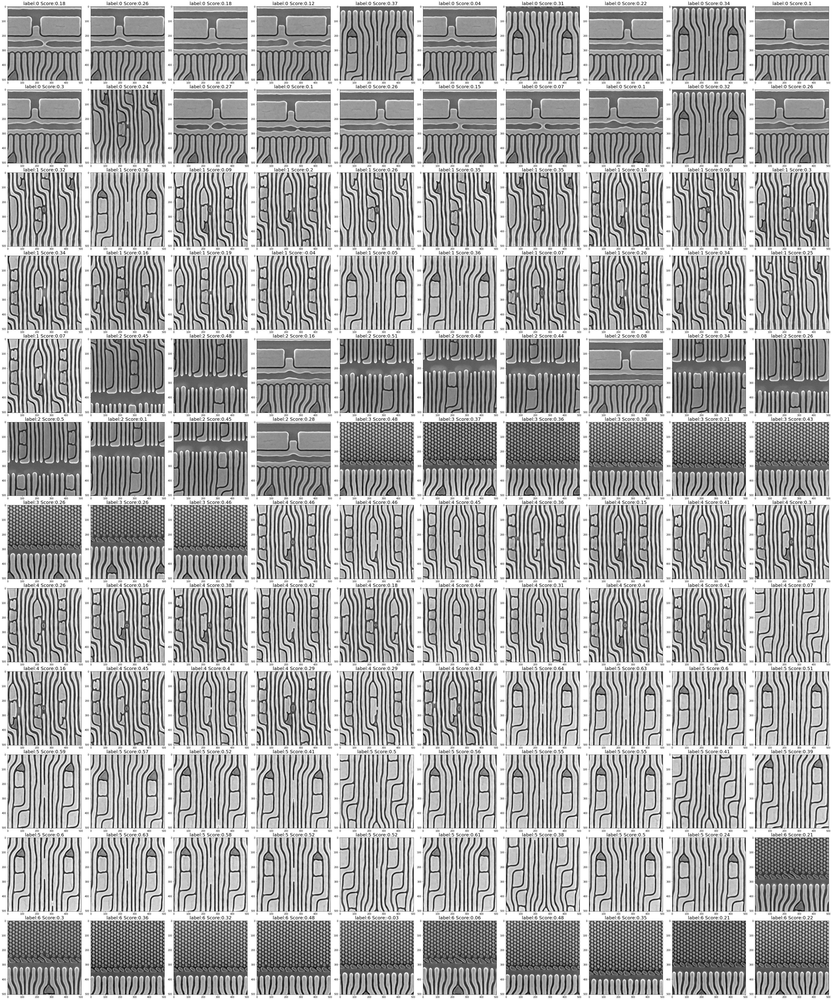

In [49]:
ncols = 10
print(len(Data))
nrows = int(len(Data)/ncols)
figsize = [50, 60]  
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
axi = ax.flat
#print(len(axi))
for i,x in enumerate(Data):
  input_img = df['Image'][i]
  axi[i].set_title("label:"+str(df['Label'][i])+" "+"Score:"+str(round(df['Score'][i],2)),fontsize =20)
  axi[i].imshow(input_img,cmap='gray',vmin=0,vmax=1)
fig.tight_layout(pad=0.3)
plt.show

In [52]:
torch.save(net.state_dict(), '/content/model.pt')

In [53]:
k_range = 20
Score = np.empty(20)
for k in range(k_range):
  kmeans = KMeans(n_clusters=k+2,random_state=0).fit(Attributes_scaled)
  Clustering_labels_k = kmeans.labels_
  Score[k] = silhouette_score(Attributes_scaled,Clustering_labels_k,metric='euclidean')
print(Score)
Max_score_k = np.argmax(Score) + 2
print(Max_score_k)


[0.71059789 0.65734572 0.46678965 0.45029102 0.36590077 0.3252896
 0.32621304 0.33464846 0.31601872 0.31967607 0.26972936 0.25455378
 0.25878241 0.29318094 0.28190798 0.2799653  0.26790724 0.26959479
 0.2611418  0.25222379]
2
